In [1]:
import geopandas
import branca as bc
import folium
from mapclassify import classify
nybb = geopandas.read_file(geopandas.datasets.get_path('nybb'))
world = geopandas.read_file(geopandas.datasets.get_path('naturalearth_lowres'))
cities = geopandas.read_file(geopandas.datasets.get_path('naturalearth_cities'))
nybb.explore(
     column="BoroName", # make choropleth based on "BoroName" column
     tooltip="BoroName", # show "BoroName" value in tooltip (on hover)
     popup=True, # show all values in popup (on click)
     tiles="CartoDB positron", # use "CartoDB positron" tiles
     cmap="Set1", # use "Set1" matplotlib colormap
     style_kwds=dict(color="black") # use black outline
    )

/opt/anaconda3/lib/python3.8/site-packages/geopandas/_compat.py:111: UserWarning: The Shapely GEOS version (3.10.2-CAPI-1.16.0) is incompatible with the GEOS version PyGEOS was compiled with (3.10.1-CAPI-1.16.0). Conversions between both will be slow.
  warnings.warn(


In [2]:
from datasets import get_path 

In [3]:
import numpy as np
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib.pyplot import figure


In [4]:
orig_df=pd.read_csv('AB_NYC_2019.csv',index_col=0)
# orig_df.shape # original shape: (48895, 15)
df=orig_df.iloc[:,:-4]
df.dropna(inplace=True) # new df shape: (48858, 10)
df=df[df['price']!=0]  # remove rows with no price
df=df.sort_values(by=['price'])

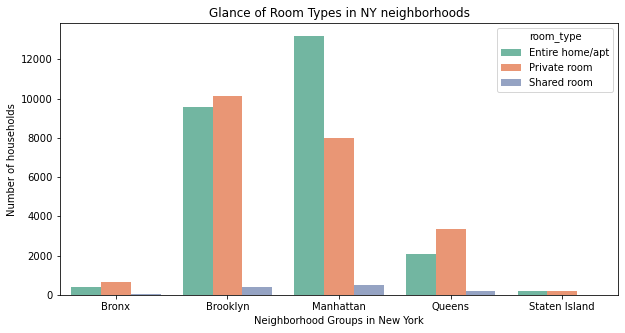

In [5]:

room_count_df=df.groupby(by = ['room_type','neighbourhood_group'])['host_id'].count().reset_index()
fig, ax = plt.subplots()
sns.barplot(ax = ax, data = room_count_df, x = 'neighbourhood_group', y = 'host_id', hue = 'room_type',palette="Set2")
fig = plt.gcf()
fig.set_size_inches(10, 5)
plt.title('Glance of Room Types in NY neighborhoods')
plt.ylabel('Number of households')
plt.xlabel('Neighborhood Groups in New York')
plt.show()


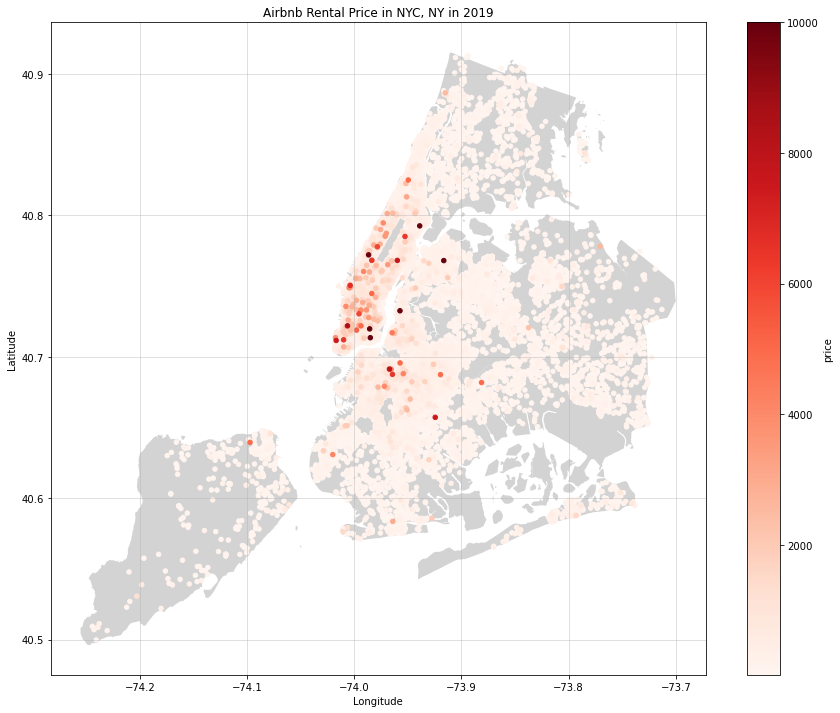

In [6]:
fig,ax=plt.subplots(figsize=(25,20))
nyc_json='/geoplot-master/geoplot/geoplot.py'
boroughs=gpd.read_file(get_path('nyc_boroughs'))
boroughs.plot(color="lightgrey",ax=ax)

df.plot(x='longitude', y='latitude', kind='scatter', c='price', s=20, colormap='Reds', ax=ax)
ax.grid(b=True, alpha=0.5)
fig=plt.gcf()
fig.set_size_inches(15, 12)
plt.title('Airbnb Rental Price in NYC, NY in 2019')
plt.ylabel('Latitude')
plt.xlabel('Longitude')
plt.show()

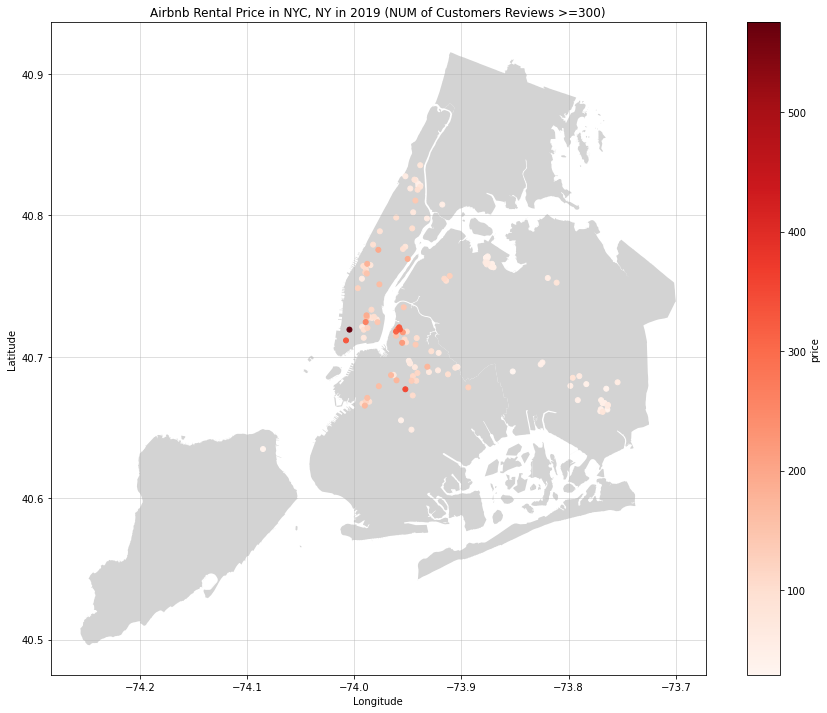

In [7]:
def filterBy_reviewNum(DataFrame,REV_THRESHOLD=100,dot_size=20):
    '''
    @param:
        DataFrame: passed-in df
        REV_THRESHOLD: filter by number of reviews
        dot_size: change the size of scatter point 
    @return:
        auto generated geo-map
    '''
    
    fig,ax=plt.subplots(figsize=(25,20))
    nyc_json='/geoplot-master/geoplot/geoplot.py'
    boroughs=gpd.read_file(get_path('nyc_boroughs'))
    boroughs.plot(color="lightgrey",ax=ax)
    
    df=DataFrame
    cur_df=df[df['number_of_reviews']>=REV_THRESHOLD]
    cur_df.plot(x='longitude', y='latitude', kind='scatter', c='price', s=dot_size, colormap='Reds', ax=ax)
    ax.grid(b=True, alpha=0.5)
    fig=plt.gcf()
    fig.set_size_inches(15, 12)
    plt.title("Airbnb Rental Price in NYC, NY in 2019 (NUM of Customers Reviews >="+str(REV_THRESHOLD)+')')
    plt.ylabel('Latitude')
    plt.xlabel('Longitude')
    plt.show()

df=df.sort_values(by=['price'])
filterBy_reviewNum(df,300,25)

<AxesSubplot:>

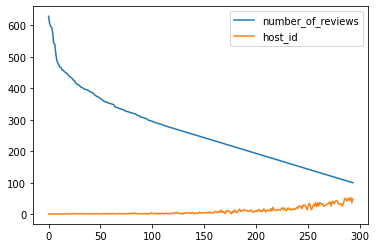

In [8]:
reviews=orig_df.groupby(['number_of_reviews']).count().reset_index()
reviews=reviews.sort_values('number_of_reviews',ascending=False).reset_index(drop=True)
reviews=reviews[reviews['number_of_reviews']>=100][['number_of_reviews','host_id']]
reviews.plot(kind = 'line')

In [9]:
from bokeh.plotting import figure, output_file, show
from bokeh.models import ColumnDataSource
from bokeh.models.tools import HoverTool

In [10]:
 
fig=figure()
p=fig.circle(x='minimum_nights', y='price', source=orig_df)
show(fig)

In [11]:
# Define function to switch from lat/long to mercator coordinates
def x_coord(x, y):
    lat = x
    lon = y
    
    r_major = 6378137.000
    x = r_major * np.radians(lon)
    scale = x/lon
    y = 180.0/np.pi * np.log(np.tan(np.pi/4.0 + 
        lat * (np.pi/180.0)/2.0)) * scale
    return (x, y)
# Define coord as tuple (lat,long)
df['coordinates'] = list(zip(df['latitude'], df['longitude']))
mercators = [x_coord(x, y) for x, y in df['coordinates'] ]

In [12]:
# Create mercator column in our df
df['mercator'] = mercators
# Split that column out into two separate columns - mercator_x and mercator_y
df[['mercator_x', 'mercator_y']] = df['mercator'].apply(pd.Series)
df.head()

,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,coordinates,mercator,mercator_x,mercator_y
id,,,,,,,,,,,,,,,
26235873,Voted #1 Airbnb In NYC,197169969,Maria,Queens,Jamaica,40.68939,-73.79886,Entire home/apt,10,2,22,"(40.68939, -73.79886)","(-8215251.516324086, 4966634.151183604)",-8.215252e+06,4.966634e+06
18490141,IT'S SIMPLY CONVENIENT!,97001292,Maria,Queens,Jamaica,40.69085,-73.79916,Entire home/apt,10,1,43,"(40.69085, -73.79916)","(-8215284.912171323, 4966848.496252531)",-8.215285e+06,4.966848e+06
17979764,Jen Apt,84497333,Jennifer,Manhattan,SoHo,40.72237,-73.99817,Private room,10,5,2,"(40.72237, -73.99817)","(-8237438.604034093, 4971477.146518636)",-8.237439e+06,4.971477e+06
28071998,Cozy room in a three-bedroom House,47516406,Arthur,Queens,Woodhaven,40.69139,-73.86086,Private room,10,7,4,"(40.69139, -73.86086)","(-8222153.324753269, 4966927.775755452)",-8.222153e+06,4.966928e+06
24114389,"Very Spacious bedroom, steps from CENTRAL PARK.",180661875,Salim,Manhattan,Upper West Side,40.76844,-73.98333,Private room,10,1,2,"(40.76844, -73.98333)","(-8235786.622790719, 4978246.380890891)",-8.235787e+06,4.978246e+06


In [13]:
from bokeh.io import output_notebook, show, output_file
from bokeh.plotting import figure, ColumnDataSource
from bokeh.tile_providers import get_provider, Vendors
from bokeh.palettes import Category10, Category20, Category20b, Category20c
from bokeh.palettes import PRGn, RdYlGn
from bokeh.transform import linear_cmap,factor_cmap
from bokeh.layouts import row, column
from bokeh.models import GeoJSONDataSource, LinearColorMapper, ColorBar, NumeralTickFormatter

chosentile = get_provider(Vendors.STAMEN_TONER)
palette = Category20c[10] #PRGn[11]
source = ColumnDataSource(data=df)
# Define color mapper - which column will define the colour of the data points
color_mapper = linear_cmap(field_name = 'price', palette = palette, low = df['price'].min(), high = df['price'].max())

# Set tooltips - these appear when we hover over a data point in our map, very nifty and very useful
tooltips = [("Price","@price"), ("Region","@neighbourhood")]
# Create figure
p = figure(title = 'Airbnb price by region in NYC', x_axis_type="mercator", y_axis_type="mercator", x_axis_label = 'Longitude', y_axis_label = 'Latitude', tooltips = tooltips)
# Add map tile
p.add_tile(chosentile)
# Add points using mercator coordinates
p.circle(x = 'mercator_x', y = 'mercator_y', color = color_mapper, source=source, size=3, fill_alpha = 0.9)
#Defines color bar
color_bar = ColorBar(color_mapper=color_mapper['transform'], 
                     formatter = NumeralTickFormatter(format='0.0[0000]'), 
                     label_standoff = 13, width=8, location=(0,0))
p.add_layout(color_bar, 'right')
output_notebook()
show(p)





Loading BokehJS ...